### Generate subpanel Figure 1b

In [1]:
## import statement

import matplotlib
from matplotlib import pyplot as plt
import matplotlib.gridspec as gridspec

import seaborn
import scanpy
import pandas
from typing import Tuple, Any, List, Union
import numpy as np
import torch
import os
from anndata import read_h5ad
from scanpy import pp
import pandas as pd
import umap
import scanpy as sc
import random
import seaborn as sns

# tissue_purifier import
import tissue_purifier as tp

In [2]:
from tissue_purifier.utils import *
from tissue_purifier.plots import *
from tissue_purifier.plots.plot_misc import *
from tissue_purifier.models.patch_analyzer import SpatialAutocorrelation, Composition
from tissue_purifier.data.dataset import MetadataCropperDataset

[neptune] [warning] NeptuneDeprecationWarning: You're importing the Neptune client library via the deprecated `neptune.new` module, which will be removed in a future release. Import directly from `neptune` instead.


In [3]:
## pytorch

torch.cuda.set_device(0)
torch.set_default_tensor_type(torch.FloatTensor)

/home/skambha6/miniforge3/envs/tissue_purifier/lib/python3.11/site-packages/torch/__init__.py:696: UserWarning: torch.set_default_tensor_type() is deprecated as of PyTorch 2.1, please use torch.set_default_dtype() and torch.set_default_device() as alternatives. (Triggered internally at /opt/conda/conda-bld/pytorch_1708025845868/work/torch/csrc/tensor/python_tensor.cpp:451.)
  _C._set_default_tensor_type(t)


In [4]:
## set seeds
r_seed=t_seed=n_seed=100

random.seed(r_seed)
torch.manual_seed(t_seed)
np.random.seed(n_seed)



## plotting functions

In [5]:
# prop_cycle = plt.rcParams['axes.prop_cycle']
# colors = prop_cycle.by_key()['color']
colors = sns.color_palette("tab10", 10).as_hex()

# assign color to cell type
cdict = {
    'ES': colors[0],
    'RS': colors[1],
    'Myoid': colors[2],
    'SPC': colors[3],
    'SPG': colors[4],
    'Sertoli': colors[5],
    'Leydig': colors[6],
    'Endothelial': colors[7],
    'Macrophage': colors[8]
}


import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable


def hex_to_rgb(value):
    value = value.lstrip('#')
    lv = len(value)
    return tuple(int(value[i:i + lv // 3], 16) for i in range(0, lv, lv // 3))


def rgb_to_hex(rgb):
    return '#%02x%02x%02x' % rgb

In [8]:
## plotting parameters

linewidth = 5
tickfontsize = 80
labelfontsize = 80
labelpad = 40
titlefontsize=80
legendfontsize=80

In [9]:
## Set working directory

import os
os.chdir("/home/skambha6/chenlab/tissue_purifier/tp_paper_figures/Figure1/plots")

In [10]:
## path names

anndata_dest_folder='/home/skambha6/chenlab/tissue_purifier/data/testis_anndata_corrected_doubletmode_annotated/'

# Make a list of all the h5ad files in the annotated_anndata_dest_folder
fname_list = []
for f in os.listdir(anndata_dest_folder):
    if f.endswith('.h5ad'):
        fname_list.append(f)
print(fname_list)

['wt3_dm.h5ad', 'wt1_dm.h5ad', 'wt2_dm.h5ad']


In [11]:
## Input Model

all_ckpts = ["testis_dino_ckpt_val_sweep_gr_best.pt"]

all_models = ["dino"]
all_ckpts_dest = []
for ckpt in all_ckpts:
    ckpt_dest = os.path.join("/home/skambha6/chenlab/tissue_purifier/model_checkpoints/testis/", ckpt)
    all_ckpts_dest.append(ckpt_dest)
    
print(all_ckpts_dest)

['/home/skambha6/chenlab/tissue_purifier/model_checkpoints/testis/testis_dino_ckpt_val_sweep_gr_best.pt']


In [12]:
compute_regress_features = False

## Collect Sparse Images and features dict


from tissue_purifier.data import AnndataFolderDM
from tissue_purifier.models.ssl_models import *

all_features_dict = {}

for ckpt_path, model_name in zip(all_ckpts_dest, all_models):
    
    print("----------")
    print("Model --->", model_name, ckpt_path)
    print("----------")
    
    # load the model from checkpoint
    if model_name == "barlow":
        model = tp.models.ssl_models.Barlow.load_from_checkpoint(checkpoint_path=ckpt_path, strict=False)
    elif model_name == "simclr":
        model = tp.models.ssl_models.Simclr.load_from_checkpoint(checkpoint_path=ckpt_path, strict=False)
    elif model_name == "dino":
        model = tp.models.ssl_models.Dino.load_from_checkpoint(checkpoint_path=ckpt_path, strict=False)
    elif model_name == "vae":
        model = tp.models.ssl_models.Vae.load_from_checkpoint(checkpoint_path=ckpt_path, strict=False)
    else:
        raise Exception("Model name not recongnized {}".format(model_name))
        
    # create the datamodule associated with the pretrained model
    dm = tp.data.AnndataFolderDM(**model._hparams) 
    
    # put the model on GPU if available
    if torch.cuda.is_available():
        model = model.cuda()
        
    sp_images = []
    list_of_dict = []
    anndata_list = []
    
    for i in range(len(fname_list)):
        
        fname = fname_list[i]
        
        # open adata and convert to sparse_image
        adata_path = os.path.join(anndata_dest_folder, fname)
        adata = read_h5ad(adata_path)
        
        del adata.obsm[model_name]

        anndata_list.append(adata)
        
        sp_img = dm.anndata_to_sparseimage(adata)
        
        #compute ncv with different k
        for k in [100]:
            ncv = sp_img.compute_ncv(feature_name="ncv_k{}".format(k), k=k)
          
        # put sparse image on GPU if available
        if torch.cuda.is_available():
            sp_img = sp_img.cuda()
            
        # compute the patch-feature (internally it crops sparse image and feed crops to pretrained model)
        patches = sp_img.compute_patch_features(
            feature_name=model_name, 
            datamodule=dm, 
            model=model, 
            batch_size=64,
            strategy = 'random',
            n_patches_max = 1000,
            fraction_patch_overlap = 0.0,
            overwrite=True,
            return_crops = True,
            compute_ncv = True,
            apply_transform=True,
            remove_overlap = False)
        
        new_dict = sp_img._patch_properties_dict
        new_dict['classify_tissue_label'] = np.repeat(i, patches.shape[0]) ## check .shape[0] vs .shape[1]

        if 'wt' in fname:
            new_dict['classify_condition'] = np.repeat(0, patches.shape[0])
        elif 'diabetes' in fname:
            new_dict['classify_condition'] = np.repeat(1, patches.shape[0])
            
        ## assert dino_patch_xywh = ncv_patch_xywh
        
        
        ## Compute regress features 
        if compute_regress_features:
            loc_key = model_name + '_patch_xywh'
            loc_x_tmp = sp_img._patch_properties_dict[loc_key][:,0]
            loc_y_tmp = sp_img._patch_properties_dict[loc_key][:,1]

            list_morans = [dm.compute_moran(sparse_tensor.to_sparse()) for sparse_tensor in patches]
            statuses = [sp_img._sample_status for sparse_tensor in patches] ## replicate instead; same status for all patches in this sp img
            list_composition = Composition(return_fraction=True)(patches)
            metadatas = [MetadataCropperDataset(f_name=fname, loc_x=loc_x, loc_y=loc_y, moran=moran, sample_status=status, composition=composition) for
                     loc_x, loc_y, moran, status, composition in zip(loc_x_tmp, loc_y_tmp, list_morans, statuses,list_composition)] 


            dict_regress = concatenate_list_of_dict([dm.get_metadata_to_regress(metadata)
                                                 for metadata in metadatas])
        
            new_dict.update(dict_regress)
        
        sp_images.append(sp_img.cpu())
        list_of_dict.append(new_dict)
        
        # free memory by erasing the sparse_image
        del sp_img
    
    model_features_dict = concatenate_list_of_dict(list_of_dict)   
    all_features_dict.update(model_features_dict)   
    
    # after loop over anndata erase the model and free memory
    del model
    
print("Finished")

/home/skambha6/miniforge3/envs/tissue_purifier/lib/python3.11/site-packages/pl_bolts/__init__.py:11: FutureWarning: In the future `np.object` will be defined as the corresponding NumPy scalar.
  if not hasattr(numpy, tp_name):
/home/skambha6/miniforge3/envs/tissue_purifier/lib/python3.11/site-packages/pl_bolts/__init__.py:11: FutureWarning: In the future `np.bool` will be defined as the corresponding NumPy scalar.
  if not hasattr(numpy, tp_name):
/home/skambha6/miniforge3/envs/tissue_purifier/lib/python3.11/site-packages/pl_bolts/models/self_supervised/amdim/amdim_module.py:34: UnderReviewWarning: The feature generate_power_seq is currently marked under review. The compatibility with other Lightning projects is not guaranteed and API may change at any time. The API and functionality may change without warning in future releases. More details: https://lightning-bolts.readthedocs.io/en/latest/stability.html
  "lr_options": generate_power_seq(LEARNING_RATE_CIFAR, 11),
/home/skambha6/mini

----------
Model ---> dino /home/skambha6/chenlab/tissue_purifier/model_checkpoints/testis/testis_dino_ckpt_val_sweep_gr_best.pt
----------


/home/skambha6/miniforge3/envs/tissue_purifier/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/skambha6/miniforge3/envs/tissue_purifier/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/skambha6/miniforge3/envs/tissue_purifier/lib/python3.11/site-packages/torch/nn/utils/weight_norm.py:28: UserWarning: torch.nn.utils.weight_norm is deprecated in favor of torch.nn.utils.parametrizations.weight_norm.
  warnings.warn("torch.nn.utils.weight_norm is deprecated in favor of torch.nn.utils

number of elements ---> 35797
mean and median spacing 15.760547246990356, 15.570735462452099
The dense shape of the image is -> torch.Size([9, 1179, 1180])
number of elements ---> 29178
mean and median spacing 15.90507495709278, 15.497339152935078
The dense shape of the image is -> torch.Size([9, 1178, 1175])


number of elements ---> 29607
mean and median spacing 15.810478612949094, 15.727658385209352
The dense shape of the image is -> torch.Size([9, 1180, 855])
Finished


In [14]:
ref_sample_id = np.where(np.array(fname_list) == 'wt3_dm.h5ad')[0][0]

query_sample_id = np.where(np.array(fname_list) == 'wt3_dm.h5ad')[0][0]

sp_images[ref_sample_id].transfer_patch_to_spot(keys_to_transfer=model_name,
            overwrite=True)

sp_images[query_sample_id].transfer_patch_to_spot(keys_to_transfer=model_name,
            overwrite=True)

adata_ref = sp_images[ref_sample_id].to_anndata()

adata_query = sp_images[query_sample_id].to_anndata()

In [15]:
adata_ref.obs['cell_type'] = adata_ref.obsm['cell_type_proportions'].idxmax(axis=1)
adata_query.obs['cell_type'] = adata_query.obsm['cell_type_proportions'].idxmax(axis=1)

/tmp/ipykernel_1584500/1519537893.py:70: RuntimeWarning: invalid value encountered in divide
  sim_n = np.sum(adata_query.obsm[rep_key] * ref_z[None, :], -1) / (np.linalg.norm(adata_query.obsm[rep_key], axis=-1) * np.linalg.norm(ref_z))
/tmp/ipykernel_1584500/1519537893.py:113: RuntimeWarning: invalid value encountered in divide
  sim_n = np.sum(adata_query.obsm[rep_key] * ref_z[None, :], -1) / (np.linalg.norm(adata_query.obsm[rep_key], axis=-1) * np.linalg.norm(ref_z))


(3700.0, 2100.0)
(3700.0, 2100.0)


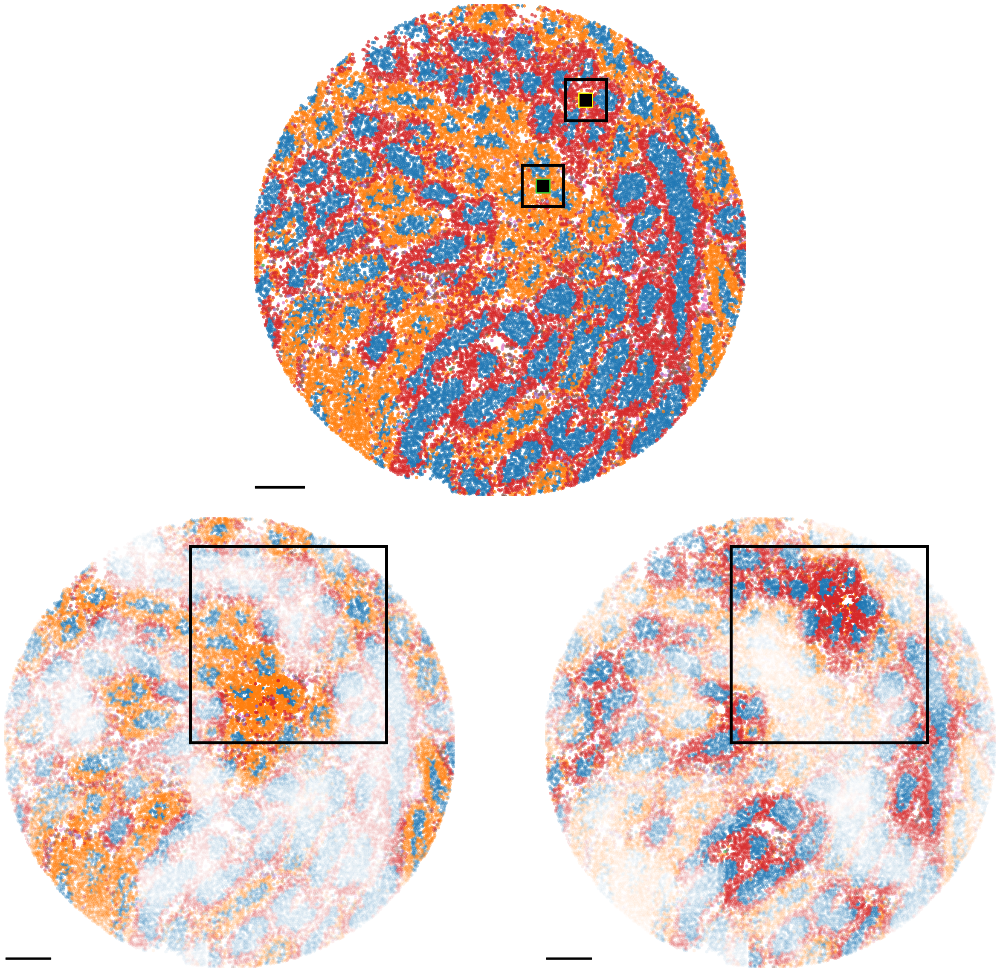

In [16]:
import matplotlib.patches as patches
from matplotlib.collections import PatchCollection
from matplotlib_scalebar.scalebar import ScaleBar 

# Create a figure
fig = plt.figure(figsize=(30,30))

# Define the grid layout
gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1], height_ratios=[1, 1], hspace=0.0)

s = 40
dist_type = 'cosine'
rep_key = model_name

# First row, centered plot
ax1 = fig.add_subplot(gs[0, 0:2])
ax1.plot([0, 1], [0, 1])  # Replace with your plot

scatter(adata_query, 'cell_type', x_key='y', y_key='x', mode='categorical', cdict=cdict, s=s, fig=fig, ax=ax1, ticks_off=True, show_legend=False, alpha=0.7, rasterized=True)
ax1.set_facecolor('white')

# highlight the reference point
highlight_list = [
    (3900., 1700., 'yellow'),
    (3500., 2500., 'limegreen')
]

for x_ref, y_ref, highlight_color in highlight_list:
    ref_point_idx = np.argmin((adata_ref.obs['y'].values - x_ref) ** 2 + (adata_ref.obs['x'].values - y_ref) **2)
    patch_size = 128
    rect = patches.Rectangle(
        (x_ref - patch_size / 2, y_ref - patch_size / 2),
        patch_size, patch_size,
        linewidth=2, edgecolor=highlight_color, facecolor='black')
    ax1.add_patch(rect)

    patch_size = 384
    rect = patches.Rectangle(
        (x_ref - patch_size / 2, y_ref - patch_size / 2),
        patch_size, patch_size,
        linewidth=5, edgecolor='black', facecolor='none')
    ax1.add_patch(rect)




ax1.axis('off'),

## first query
i = 1
x_ref, y_ref, highlight_color = highlight_list[i]

# Second row, first plot
ax2 = fig.add_subplot(gs[1, 0])

ref_point_idx = np.argmin((adata_ref.obs['y'].values - x_ref) ** 2 + (adata_ref.obs['x'].values - y_ref) **2)

# calculate similarity
ref_z = adata_ref.obsm[rep_key][ref_point_idx]

if dist_type == 'euclidean':
    dist_n = np.linalg.norm(adata_query.obsm[rep_key] - ref_z[None, :], axis=-1)
    sim_n = np.exp(-dist_n / (2.0 * np.std(dist_n)))

elif dist_type == 'cosine':
    sim_n = np.sum(adata_query.obsm[rep_key] * ref_z[None, :], -1) / (np.linalg.norm(adata_query.obsm[rep_key], axis=-1) * np.linalg.norm(ref_z))
    sim_n = np.clip(sim_n, a_min=0., a_max=1.) ** 5 
    sim_n[np.where(np.isnan(sim_n))[0]] = 0
    
adata_query.obs['sim'] = sim_n



scatter(adata_query, 'cell_type', alpha_key='sim', x_key='y', y_key='x', mode='categorical', cdict=cdict, s=s, fig=fig, ax=ax2, ticks_off=True, show_legend=False, linewidth=0, rasterized=True)

patch_size = 2000
retrieval_point = ((highlight_list[0][0] + highlight_list[1][0]) / 2, (highlight_list[0][1] + highlight_list[1][1] ) / 2)
print(retrieval_point)
rect = patches.Rectangle(
    (retrieval_point[0] - patch_size / 2, retrieval_point[1] - patch_size / 2),
    patch_size, patch_size,
    linewidth=5, edgecolor='black', facecolor='none')
ax2.add_patch(rect)


ax2.set_facecolor('white')
ax2.axis('off'),


## second query
i = 0

x_ref, y_ref, highlight_color = highlight_list[i]

# Second row, second plot
ax3 = fig.add_subplot(gs[1, 1])

ref_point_idx = np.argmin((adata_ref.obs['y'].values - x_ref) ** 2 + (adata_ref.obs['x'].values - y_ref) **2)

# calculate similarity
ref_z = adata_ref.obsm[rep_key][ref_point_idx]

if dist_type == 'euclidean':
    dist_n = np.linalg.norm(adata_query.obsm[rep_key] - ref_z[None, :], axis=-1)
    sim_n = np.exp(-dist_n / (2.0 * np.std(dist_n)))

elif dist_type == 'cosine':
    sim_n = np.sum(adata_query.obsm[rep_key] * ref_z[None, :], -1) / (np.linalg.norm(adata_query.obsm[rep_key], axis=-1) * np.linalg.norm(ref_z))
    sim_n = np.clip(sim_n, a_min=0., a_max=1.) ** 5 
    sim_n[np.where(np.isnan(sim_n))[0]] = 0
    
adata_query.obs['sim'] = sim_n

## draw patch around inset




from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar



scatter(adata_query, 'cell_type', alpha_key='sim', x_key='y', y_key='x', mode='categorical', cdict=cdict, s=s, fig=fig, ax=ax3, ticks_off=True, show_legend=False, linewidth=0, rasterized=True)

patch_size = 2000
retrieval_point = ((highlight_list[0][0] + highlight_list[1][0]) / 2, (highlight_list[0][1] + highlight_list[1][1] ) / 2)
print(retrieval_point)
rect = patches.Rectangle(
    (retrieval_point[0] - patch_size / 2, retrieval_point[1] - patch_size / 2),
    patch_size, patch_size,
    linewidth=5, edgecolor='black', facecolor='none')
ax3.add_patch(rect)


ax3.set_facecolor('white')
ax3.axis('off')

# Create scale bar

# Define the size bar
scalebar = AnchoredSizeBar(ax1.transData,
                           461.54, '', 'lower left', 
                           pad=0.1,
                           color='black',
                           frameon=False,
                           size_vertical=20)

# Add the scalebar to the plot
ax1.add_artist(scalebar)

scalebar = AnchoredSizeBar(ax2.transData,
                           461.54, '', 'lower left', 
                           pad=0.1,
                           color='black',
                           frameon=False,
                           size_vertical=20)
ax2.add_artist(scalebar)

scalebar = AnchoredSizeBar(ax3.transData,
                           461.54, '', 'lower left', 
                           pad=0.1,
                           color='black',
                           frameon=False,
                           size_vertical=20)
ax3.add_artist(scalebar)

fig.savefig('fig_1b.pdf', transparent=True, bbox_inches='tight',dpi=600)

In [18]:
sim_n = [0, 0.87, 1.0]
sim_n = np.clip(sim_n, a_min=0., a_max=1.) ** 5 
sim_n

array([0.        , 0.49842092, 1.        ])

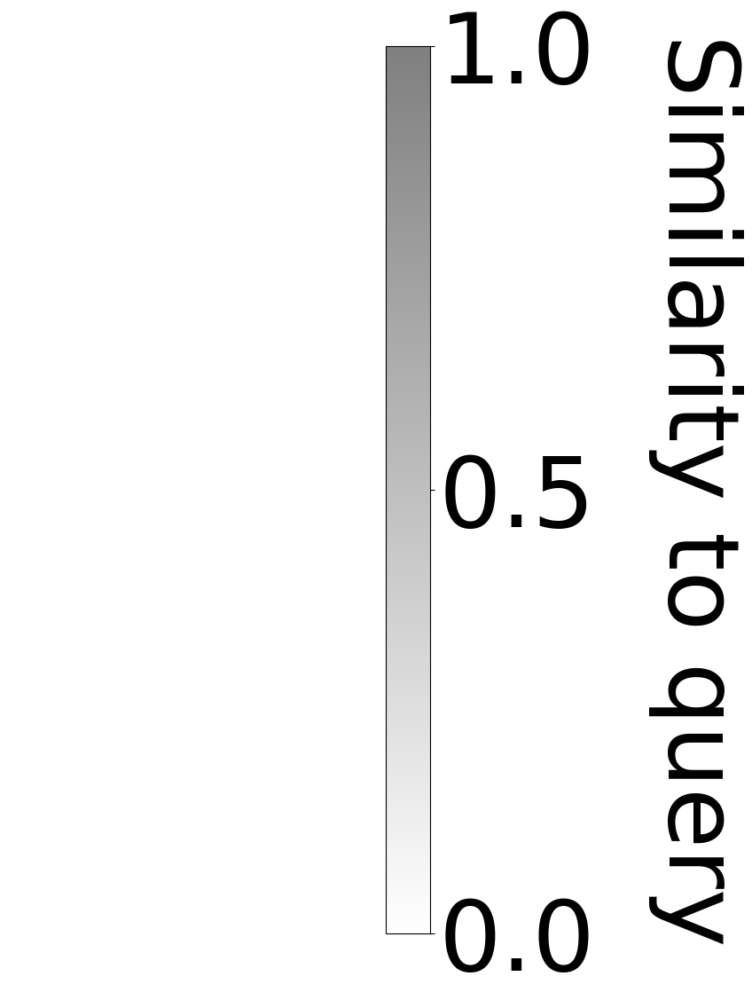

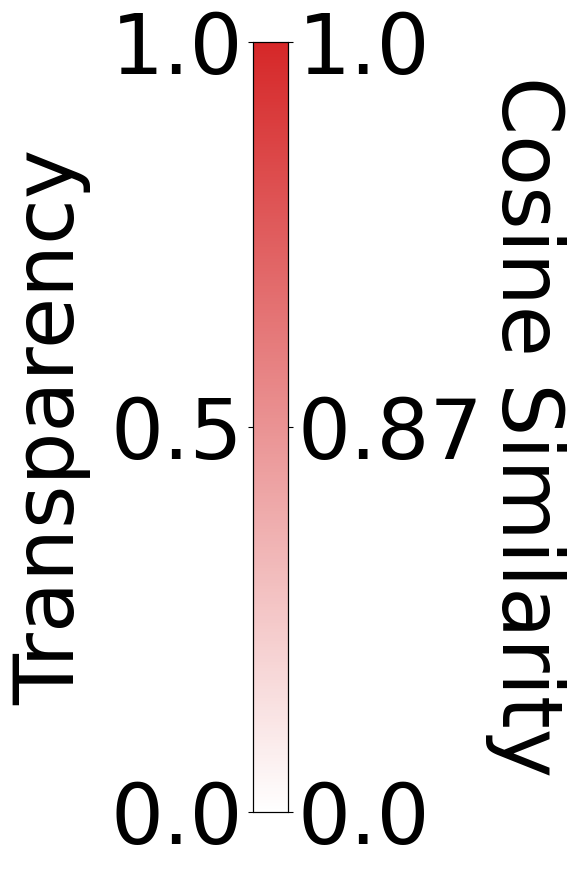

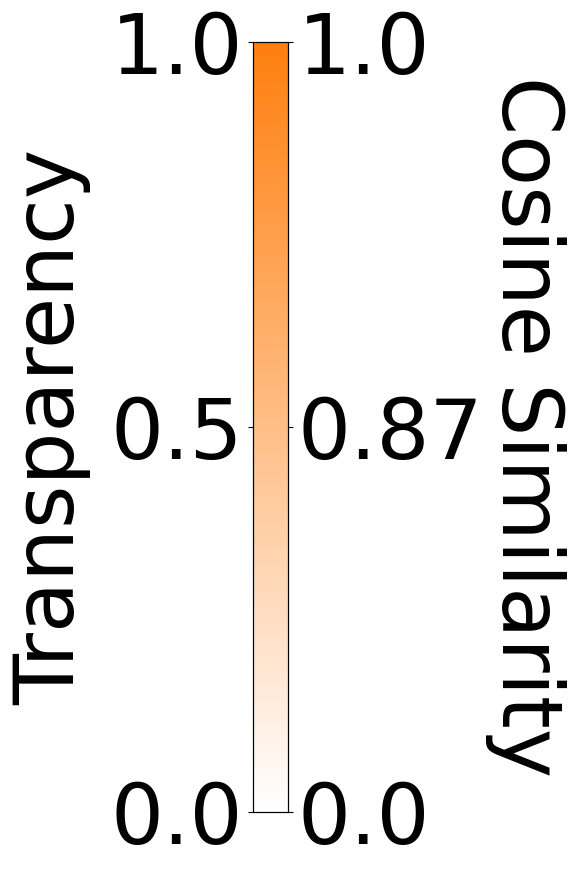

In [28]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

def create_alphabar(color, filename):
    # Create a gradient of alpha values from 0 to 1
    alpha_values = np.linspace(0, 1, 256)
    
    # Create a color array which repeats the base color but changes the alpha
    colors = np.zeros((256, 4))
    colors[:, :3] = mcolors.to_rgba(color)[:3]
    colors[:, 3] = alpha_values
    
    # Create a figure and axis for the colorbar
    fig, ax = plt.subplots(figsize=(5, 10))
    fig.subplots_adjust(left=0, right=1, bottom=0, top=1)  # Remove margins
    ax.axis('off')  # Turn off axis
    
    # Create a colorbar with the created colors
    cmap = plt.cm.colors.ListedColormap(colors)
    norm = plt.cm.colors.Normalize(vmin=0, vmax=1)
    cb = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax, orientation='vertical')
    cb.set_ticks([0, 0.5, 1])
    cb.set_ticklabels(['0.0', '0.5', '1.0'])
    cb.ax.tick_params(labelsize=tickfontsize)
    cb.set_label('Similarity to query', fontsize=labelfontsize, rotation=270,labelpad=labelpad*3)
    
    # plt.savefig(filename, transparent=True, bbox_inches='tight',dpi=600)


def create_alphabar_flipped(color, filename):
    # Create a gradient of alpha values from 0 to 1
    alpha_values = np.linspace(0, 1, 256)
    
    # Create a color array which repeats the base color but changes the alpha
    colors = np.zeros((256, 4))
    colors[:, :3] = mcolors.to_rgba(color)[:3]
    colors[:, 3] = alpha_values
    
    # Create a figure and axis for the colorbar
    fig, ax = plt.subplots(figsize=(3, 10))
    # fig.subplots_adjust(left=0, right=1, bottom=0, top=1)  # Remove margins
    ax.axis('off')  # Turn off axis
    
    # Create a colorbar with the created colors
    cmap = plt.cm.colors.ListedColormap(colors)
    norm = plt.cm.colors.Normalize(vmin=0, vmax=1)
    cb = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax, orientation='vertical')
    # cb.set_ticks([0, 0.5, 1])
    # cb.set_ticklabels(['0.0', '0.5', '1.0'])
    ax1 = cb.ax
    ax1.set_yticks([0, 0.5, 1])
    ax1.tick_params(labelsize=tickfontsize)
    ax1.yaxis.set_ticks_position('left')
    ax1.set_yticklabels(['0.0', '0.5', '1.0'], fontsize=labelfontsize-20)
    ax1.set_ylabel('Transparency', fontsize=labelfontsize-20, rotation=90, labelpad=-5*labelpad)

    ax2 = ax1.twinx()
    ax2.set_yticks([0, 0.5, 1])
    ax2.tick_params(labelsize=tickfontsize)
    ax2.yaxis.set_ticks_position('right')
    ax2.set_yticklabels(['0.0', '0.87', '1.0'], fontsize=labelfontsize-20)
    ax2.set_ylabel('Cosine Similarity', fontsize=labelfontsize-20, rotation=270, labelpad=labelpad*1.5)

    plt.savefig(filename, transparent=True, bbox_inches='tight',pad_inches=0.1, dpi=600)




def create_x_alphabar_flipped(color, filename):
    # Create a gradient of alpha values from 0 to 1
    alpha_values = np.linspace(0, 1, 256)
    
    # Create a color array which repeats the base color but changes the alpha
    colors = np.zeros((256, 4))
    colors[:, :3] = mcolors.to_rgba(color)[:3]
    colors[:, 3] = alpha_values
    
    # Create a figure and axis for the colorbar
    fig, ax = plt.subplots(figsize=(10,5))
    # fig.subplots_adjust(left=0, right=1, bottom=0, top=1)  # Remove margins
    ax.axis('off')  # Turn off axis
    
    # Create a colorbar with the created colors
    cmap = plt.cm.colors.ListedColormap(colors)
    norm = plt.cm.colors.Normalize(vmin=0, vmax=1)
    cb = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax, orientation='horizontal')
    # cb.set_ticks([0, 0.5, 1])
    # cb.set_ticklabels(['0.0', '0.5', '1.0'])
    ax1 = cb.ax
    ax1.set_xticks([0, 0.5, 1])
    ax1.tick_params(labelsize=tickfontsize)
    ax1.xaxis.set_ticks_position('bottom')
    ax1.set_xticklabels(['0.0', '0.5', '1.0'], fontsize=labelfontsize)
    ax1.set_xlabel('Transparency', fontsize=labelfontsize, rotation=0) #, labelpad=labelpad)

    ax2 = ax1.twiny()
    ax2.set_xticks([0, 0.5, 1])
    ax2.tick_params(labelsize=tickfontsize)
    ax2.xaxis.set_ticks_position('top')
    ax2.set_xticklabels(['0.0', '0.87', '1.0'], fontsize=labelfontsize)
    ax2.set_xlabel('Cosine Similarity', fontsize=labelfontsize, rotation=0,labelpad=labelpad)
    
    # cb.set_ticklabels(['0.0', '0.87', '1.0'])
    # cb.ax.tick_params(labelsize=tickfontsize)
    # cb.ax.yaxis.set_ticks_position('right')
    # cb.set_label('Cosine similarity', fontsize=labelfontsize, labelpad=7*labelpad)

    #     # Create a colorbar with the created colors
    # cmap = plt.cm.colors.ListedColormap(colors)
    # norm = plt.cm.colors.Normalize(vmin=0, vmax=1)
    # cb = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax, orientation='vertical')
    # cb.set_ticks([0, 0.5, 1])
    # cb.set_ticklabels(['0.0', '0.87', '1.0'])
    # cb.ax.tick_params(labelsize=tickfontsize)
    # cb.ax.yaxis.set_ticks_position('right')
    # cb.set_label('Cosine similarity', fontsize=labelfontsize, labelpad=-7*labelpad)
    
    print(filename)

    plt.savefig(filename, transparent=True, bbox_inches='tight',pad_inches=0.1, dpi=600)

colors_rgb = sns.color_palette("tab10", 10)

# create_alphabar([0.5, 0.5, 0.5], 'fig_1b_alphabar.pdf')  # RGB for grey
# create_alphabar([255/255, 127/255, 14/255])  # RGB for tab: orange
# create_alphabar([214/255, 39/255, 40/255], 'fig_1b_alphabar_inset4.pdf')  # RGB for tab: red
# create_alphabar_flipped([255/255, 127/255, 14/255], 'fig_1b_alphabar_inset3.pdf')  # RGB for tab: orange

create_alphabar_flipped(colors_rgb[3], '/home/skambha6/chenlab/tissue_purifier/tp_paper_figures/Figure1/plots/fig_1b_alphabar_inset3.pdf')  # RGB for tab: red
create_alphabar_flipped(colors_rgb[1], '/home/skambha6/chenlab/tissue_purifier/tp_paper_figures/Figure1/plots/fig_1b_alphabar_inset4.pdf')  # RGB for tab: orange



/tmp/ipykernel_1584500/47072274.py:64: RuntimeWarning: invalid value encountered in divide
  sim_n = np.sum(adata_query.obsm[rep_key] * ref_z[None, :], -1) / (np.linalg.norm(adata_query.obsm[rep_key], axis=-1) * np.linalg.norm(ref_z))


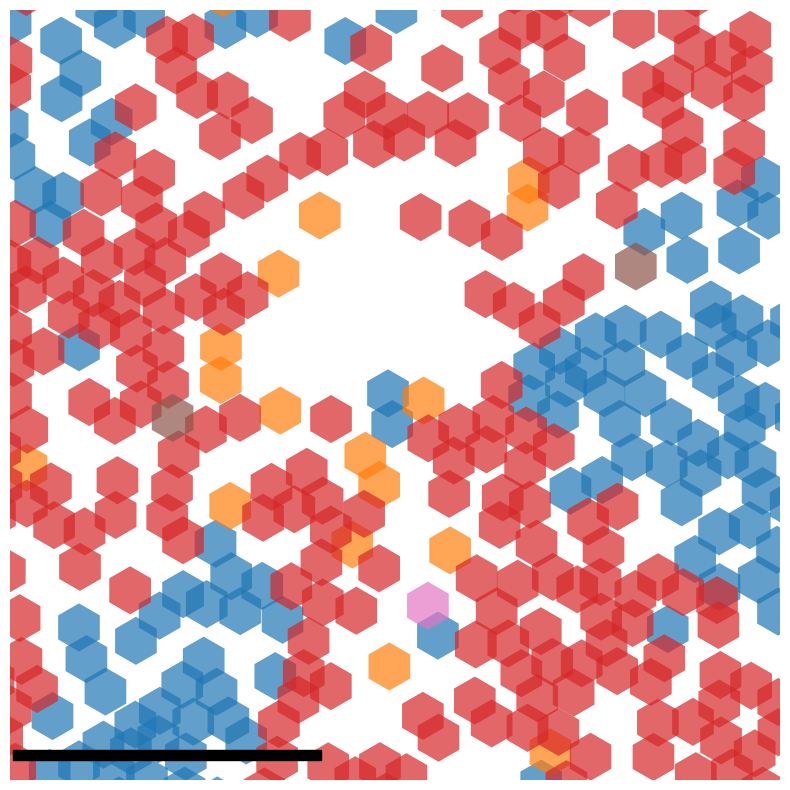

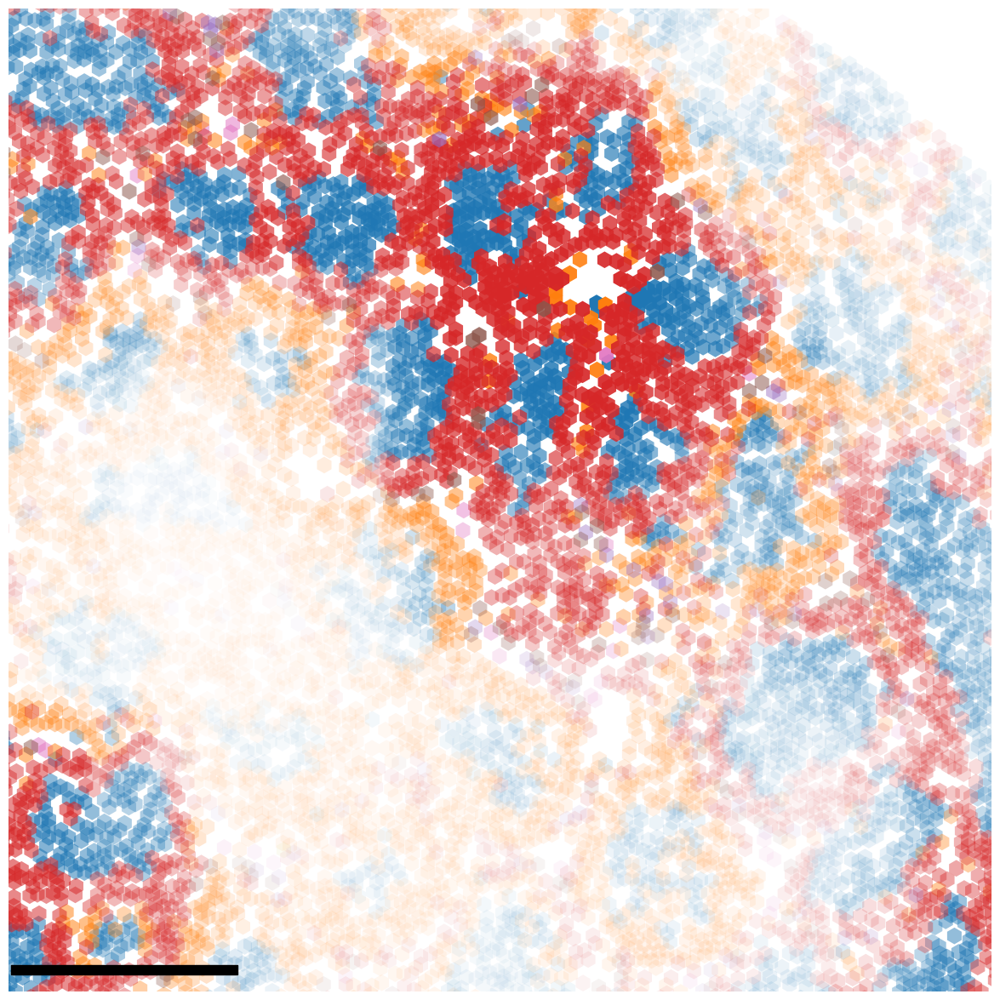

In [21]:
## plot insets

## first query


s = 1200
dist_type = 'cosine'
rep_key = model_name

## first query
i = 0

# highlight the reference point
highlight_list = [
    (3900., 1700., 'yellow'),
    (3500., 2500., 'limegreen')
]

fig, ax1 = plt.subplots(facecolor='white', figsize=(10,10))


scatter(adata_query, 'cell_type', x_key='y', y_key='x', mode='categorical', cdict=cdict, s=s, fig=fig, ax=ax1, ticks_off=True, show_legend=False, alpha=0.7, rasterized=True,
        x_lim=(int(highlight_list[i][0] - 96*2), int(highlight_list[i][0] + 96*2)), y_lim=(highlight_list[i][1] - 96*2, highlight_list[i][1] + 96*2))
ax1.set_facecolor('white')



x_ref, y_ref, highlight_color = highlight_list[i]
ref_point_idx = np.argmin((adata_ref.obs['y'].values - x_ref) ** 2 + (adata_ref.obs['x'].values - y_ref) **2)
patch_size = 128
rect = patches.Rectangle(
    (x_ref - patch_size / 2, y_ref - patch_size / 2),
    patch_size, patch_size,
    linewidth=2, edgecolor=highlight_color, facecolor='black')
# ax1.add_patch(rect)

ax1.axis('off')

scalebar = AnchoredSizeBar(ax1.transData,
                           153.85, '', 'lower left', 
                           pad=0.1,
                           color='black',
                           frameon=False,
                           size_vertical=5)
ax1.add_artist(scalebar)


s = 200

x_ref, y_ref, highlight_color = highlight_list[i]

# Second row, first plot

ref_point_idx = np.argmin((adata_ref.obs['y'].values - x_ref) ** 2 + (adata_ref.obs['x'].values - y_ref) **2)

# calculate similarity
ref_z = adata_ref.obsm[rep_key][ref_point_idx]

if dist_type == 'euclidean':
    dist_n = np.linalg.norm(adata_query.obsm[rep_key] - ref_z[None, :], axis=-1)
    sim_n = np.exp(-dist_n / (2.0 * np.std(dist_n)))
    
elif dist_type == 'cosine':
    sim_n = np.sum(adata_query.obsm[rep_key] * ref_z[None, :], -1) / (np.linalg.norm(adata_query.obsm[rep_key], axis=-1) * np.linalg.norm(ref_z))
    sim_n = np.clip(sim_n, a_min=0., a_max=1.) ** 5 
    sim_n[np.where(np.isnan(sim_n))[0]] = 0
    
adata_query.obs['sim'] = sim_n

fig.savefig('fig_1b_inset1.pdf', transparent=True, bbox_inches='tight',dpi=600)

fig, ax2 = plt.subplots(facecolor='white', figsize=(15, 15))

retrieval_point = ((highlight_list[0][0] + highlight_list[1][0]) / 2, (highlight_list[0][1] + highlight_list[1][1] ) / 2)
patch_size = 2000

scatter(adata_query, 'cell_type', alpha_key='sim', x_key='y', y_key='x', mode='categorical', cdict=cdict, s=s, fig=fig, ax=ax2, ticks_off=True, show_legend=False, linewidth=0, rasterized=True, 
        x_lim=(int(retrieval_point[0] - patch_size/2), int(retrieval_point[0] + patch_size/2)), y_lim=(int(retrieval_point[1] - patch_size/2), int(retrieval_point[1] + patch_size/2)))

ax2.set_facecolor('white')
ax2.axis('off')


scalebar = AnchoredSizeBar(ax2.transData,
                           461.54, '', 'lower left', 
                           pad=0.1,
                           color='black',
                           frameon=False,
                           size_vertical=20)
ax2.add_artist(scalebar)

fig.savefig('fig_1b_inset2.pdf', transparent=True, bbox_inches='tight',dpi=600)

/tmp/ipykernel_1584500/2752810063.py:64: RuntimeWarning: invalid value encountered in divide
  sim_n = np.sum(adata_query.obsm[rep_key] * ref_z[None, :], -1) / (np.linalg.norm(adata_query.obsm[rep_key], axis=-1) * np.linalg.norm(ref_z))


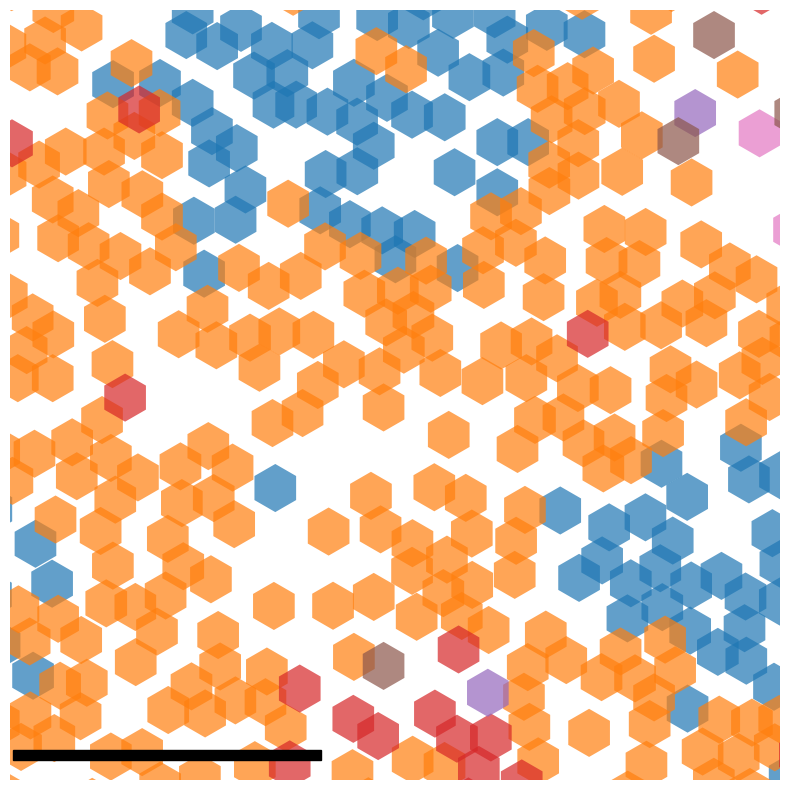

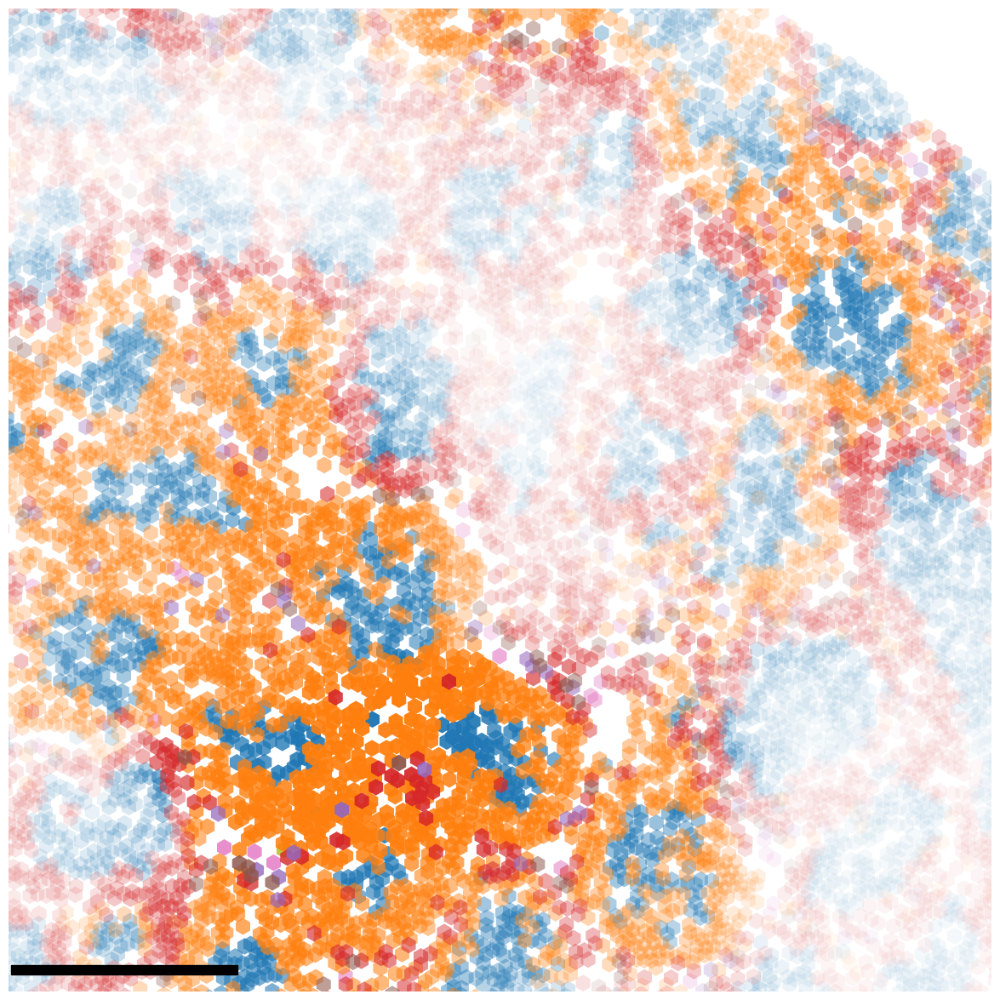

In [22]:
## plot insets

## second query


s = 1200
dist_type = 'cosine'
rep_key = model_name

## second query
i = 1

# highlight the reference point
highlight_list = [
    (3900., 1700., 'yellow'),
    (3500., 2500., 'limegreen')
]

x_ref, y_ref, highlight_color = highlight_list[i]


fig, ax1 = plt.subplots(facecolor='white', figsize=(10,10))


scatter(adata_query, 'cell_type', x_key='y', y_key='x', mode='categorical', cdict=cdict, s=s, fig=fig, ax=ax1, ticks_off=True, show_legend=False, alpha=0.7, rasterized=True,
        x_lim=(int(highlight_list[i][0] - 96*2), int(highlight_list[i][0] + 96*2)), y_lim=(highlight_list[i][1] - 96*2, highlight_list[i][1] + 96*2))
ax1.set_facecolor('white')




x_ref, y_ref, highlight_color = highlight_list[i]
ref_point_idx = np.argmin((adata_ref.obs['y'].values - x_ref) ** 2 + (adata_ref.obs['x'].values - y_ref) **2)
patch_size = 128
rect = patches.Rectangle(
    (x_ref - patch_size / 2, y_ref - patch_size / 2),
    patch_size, patch_size,
    linewidth=2, edgecolor=highlight_color, facecolor='black')
# ax1.add_patch(rect)

ax1.axis('off')
scalebar = AnchoredSizeBar(ax1.transData,
                           153.85, '', 'lower left', 
                           pad=0.1,
                           color='black',
                           frameon=False,
                           size_vertical=5)
ax1.add_artist(scalebar)


s = 200
# Second row, first plot

ref_point_idx = np.argmin((adata_ref.obs['y'].values - x_ref) ** 2 + (adata_ref.obs['x'].values - y_ref) **2)

# calculate similarity
ref_z = adata_ref.obsm[rep_key][ref_point_idx]

if dist_type == 'euclidean':
    dist_n = np.linalg.norm(adata_query.obsm[rep_key] - ref_z[None, :], axis=-1)
    sim_n = np.exp(-dist_n / (2.0 * np.std(dist_n)))

elif dist_type == 'cosine':
    sim_n = np.sum(adata_query.obsm[rep_key] * ref_z[None, :], -1) / (np.linalg.norm(adata_query.obsm[rep_key], axis=-1) * np.linalg.norm(ref_z))
    sim_n = np.clip(sim_n, a_min=0., a_max=1.) ** 5 
    sim_n[np.where(np.isnan(sim_n))[0]] = 0
    
adata_query.obs['sim'] = sim_n

fig.savefig('fig_1b_inset3.pdf', transparent=True, bbox_inches='tight',dpi=600)

fig, ax2 = plt.subplots(facecolor='white', figsize=(15,15))

retrieval_point = ((highlight_list[0][0] + highlight_list[1][0]) / 2, (highlight_list[0][1] + highlight_list[1][1] ) / 2)
patch_size = 2000

scatter(adata_query, 'cell_type', alpha_key='sim', x_key='y', y_key='x', mode='categorical', cdict=cdict, s=s, fig=fig, ax=ax2, ticks_off=True, show_legend=False, linewidth=0, rasterized=True, 
        x_lim=(int(retrieval_point[0] - patch_size/2), int(retrieval_point[0] + patch_size/2)), y_lim=(int(retrieval_point[1] - patch_size/2), int(retrieval_point[1] + patch_size/2)))

ax2.set_facecolor('white')
ax2.axis('off')

scalebar = AnchoredSizeBar(ax2.transData,
                           461.54, '', 'lower left', 
                           pad=0.1,
                           color='black',
                           frameon=False,
                           size_vertical=20)
ax2.add_artist(scalebar)

fig.savefig('fig_1b_inset4.pdf', transparent=True, bbox_inches='tight',dpi=600)